## Sentiment Data Analysis

### General Exploratory Data Analysis (EDA)

Summary Statistics:
                  joy   anticipation        disgust        sadness  \
count  300783.000000  300783.000000  300783.000000  300783.000000   
mean        0.447939       0.265968       0.164009       0.129451   
std         0.335649       0.138760       0.207359       0.140187   
min         0.004293       0.019298       0.006496       0.006896   
25%         0.116980       0.170981       0.032307       0.047649   
50%         0.409154       0.249459       0.068907       0.082274   
75%         0.781843       0.351118       0.203503       0.152488   
max         0.992590       0.888902       0.972306       0.983152   

               anger       optimism       surprise      pessimism  \
count  300783.000000  300783.000000  300783.000000  300783.000000   
mean        0.119346       0.145222       0.079710       0.036791   
std         0.196014       0.184506       0.060075       0.045141   
min         0.002611       0.004732       0.004371       0.005047   
25%         

<Figure size 1200x800 with 0 Axes>

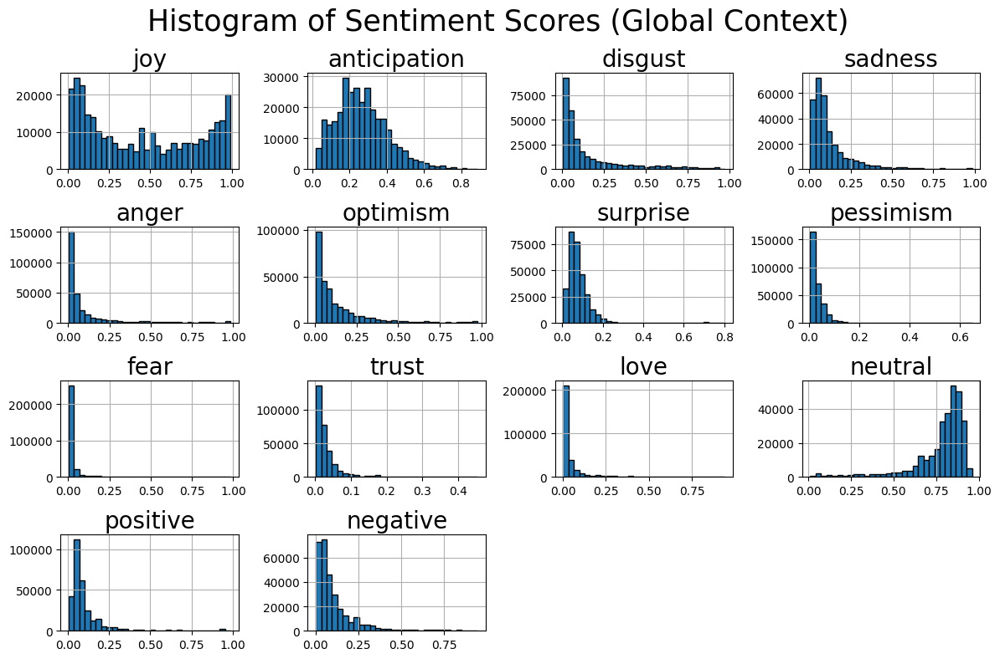

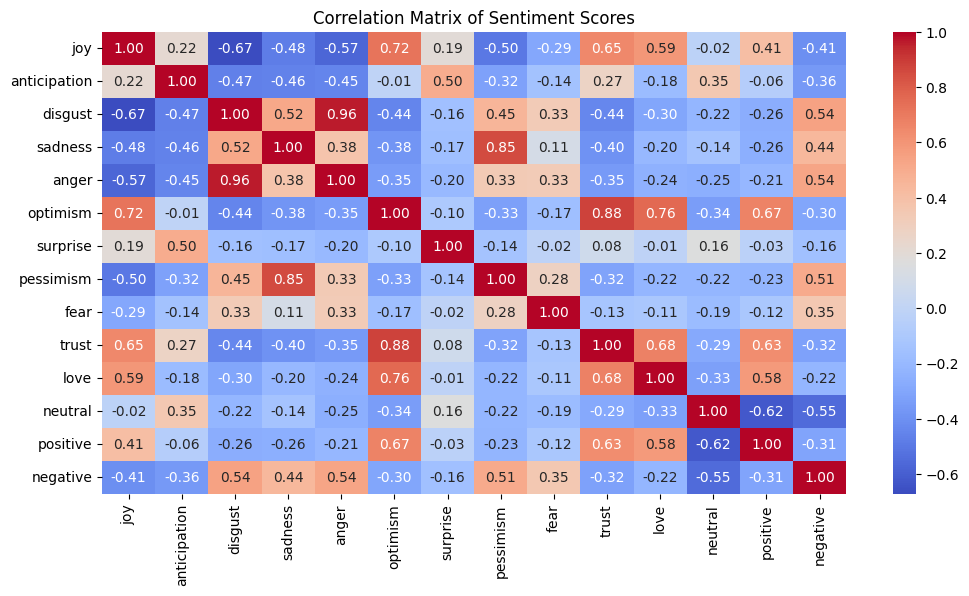

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("Dataset/sentiment_global.csv")

sentiment_cols = df.columns[2:2+14]  

### 1. Summary Statistics ###
summary_stats = df[sentiment_cols].describe()
print("Summary Statistics:\n", summary_stats)

### 2. Distribution Plots ###
plt.figure(figsize=(12, 8))
axes = df[sentiment_cols].hist(bins=30, figsize=(12, 8), layout=(4, 4), edgecolor='black')

# Increase each subplot title font size
for ax in axes.ravel():
    ax.set_title(ax.get_title(), fontsize=20)     # subtitles
    ax.tick_params(axis='both', labelsize=10)      # numbers on axes

plt.suptitle("Histogram of Sentiment Scores (Global Context)", fontsize=25)
plt.tight_layout()
plt.show()
plt.rcParams.update({'font.size': 10})
### 3. Correlation Matrix ###
plt.figure(figsize=(12, 6))
sns.heatmap(df[sentiment_cols].corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix of Sentiment Scores")
plt.show()



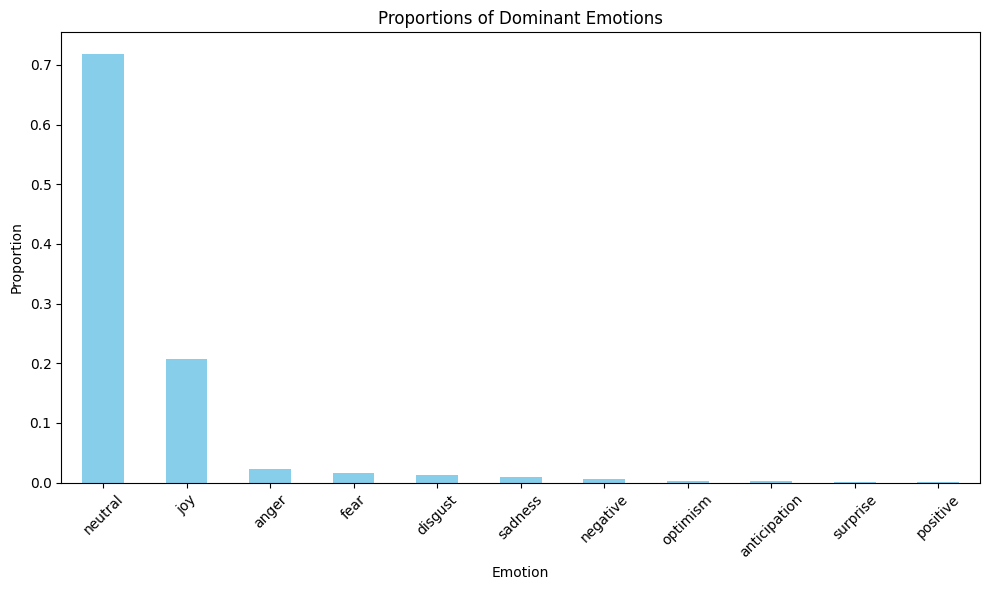

In [3]:
### 4. Sentiment Proportions ###
df["dominant_emotion"] = df[sentiment_cols].idxmax(axis=1)
proportions = df["dominant_emotion"].value_counts(normalize=True)

plt.figure(figsize=(10, 6))
proportions.plot(kind='bar', color='skyblue')
plt.title("Proportions of Dominant Emotions")
plt.xlabel("Emotion")
plt.ylabel("Proportion")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

/tmp/ipykernel_414195/1884892993.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_proportions.index, y=sentiment_proportions.values, palette="coolwarm")


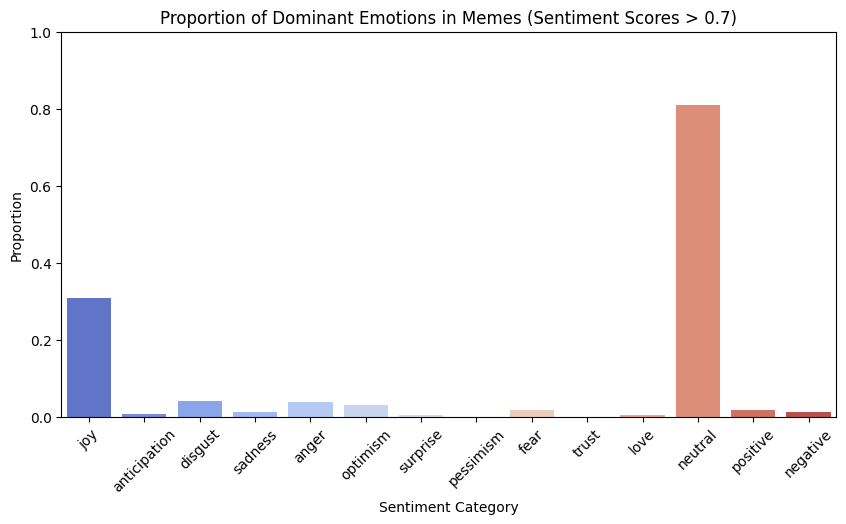

Neutral memes: 243437
Joy memes: 92393
Sadness memes: 3528
Fear memes: 5383
Anger memes: 10997
Disgust memes: 12552
Anticipation memes: 2252
Surprise memes: 875
Pessimism memes: 0
Trust memes: 0


In [4]:
sentiment_proportions = (df[sentiment_cols] > 0.7).mean()

plt.figure(figsize=(10, 5))
sns.barplot(x=sentiment_proportions.index, y=sentiment_proportions.values, palette="coolwarm")

plt.title("Proportion of Dominant Emotions in Memes (Sentiment Scores > 0.7)")
plt.xlabel("Sentiment Category")
plt.ylabel("Proportion")
plt.xticks(rotation=45)
plt.ylim(0, 1) 
plt.show()

#check how many surprise, pessimism, and trust memes are there
surprise_count = (df["surprise"] > 0.7).sum()
pessimism_count = (df["pessimism"] > 0.7).sum()
trust_count = (df["trust"] > 0.7).sum()
anticipation_count = (df["anticipation"] > 0.7).sum()
disgust_count = (df["disgust"] > 0.7).sum()
sadness_count = (df["sadness"] > 0.7).sum()
anger_count = (df["anger"] > 0.7).sum()
joy_count = (df["joy"] > 0.7).sum()
fear_count = (df["fear"] > 0.7).sum()
neutral_count = (df["neutral"] > 0.7).sum()
print(f"Neutral memes: {neutral_count}")
print(f"Joy memes: {joy_count}")
print(f"Sadness memes: {sadness_count}")
print(f"Fear memes: {fear_count}")
print(f"Anger memes: {anger_count}")
print(f"Disgust memes: {disgust_count}")
print(f"Anticipation memes: {anticipation_count}")
print(f"Surprise memes: {surprise_count}")
print(f"Pessimism memes: {pessimism_count}")
print(f"Trust memes: {trust_count}")

## Sentiment Trends and Patterns

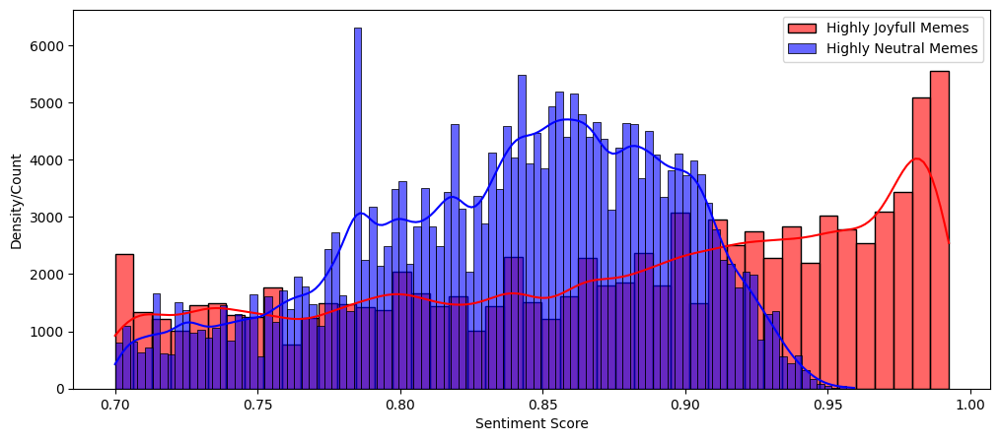

In [5]:
high_joy = df[df["joy"] > 0.7]
high_neutral = df[df["neutral"] > 0.7]

plt.figure(figsize=(12, 5))

sns.histplot(high_joy['joy'], label="Highly Joyfull Memes", color="red", alpha=0.6, kde=True)
sns.histplot(high_neutral['neutral'], label="Highly Neutral Memes", color="blue", alpha=0.6, kde=True)

plt.xlabel("Sentiment Score")
plt.ylabel("Density/Count")
plt.legend()
plt.show()

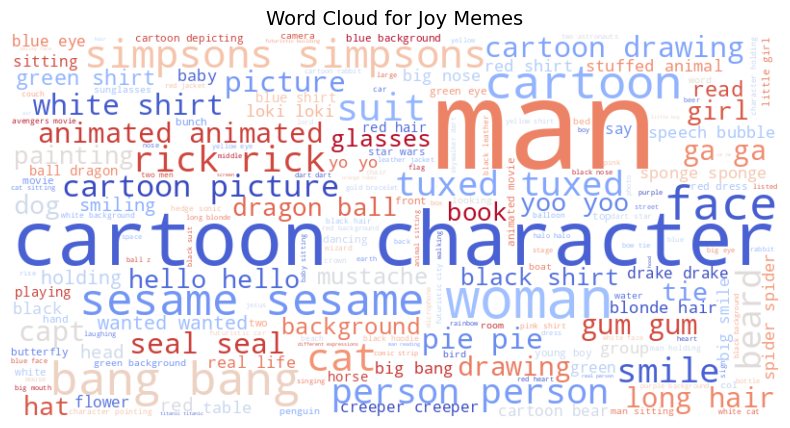

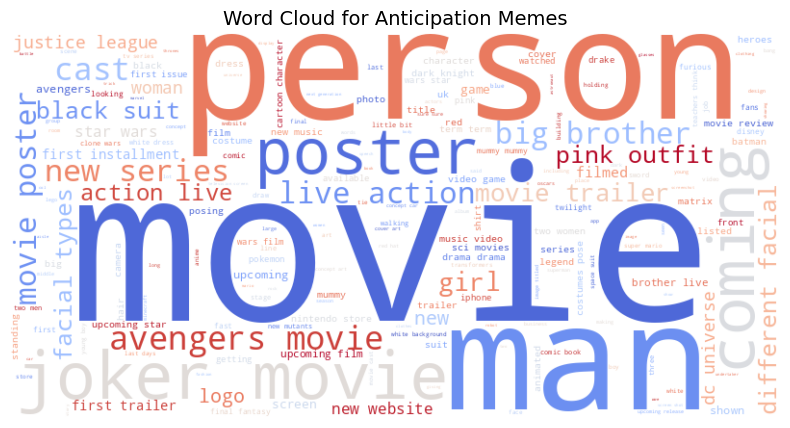

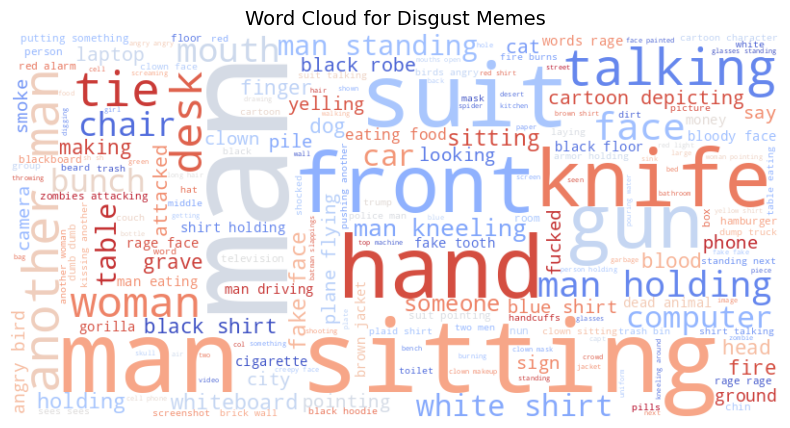

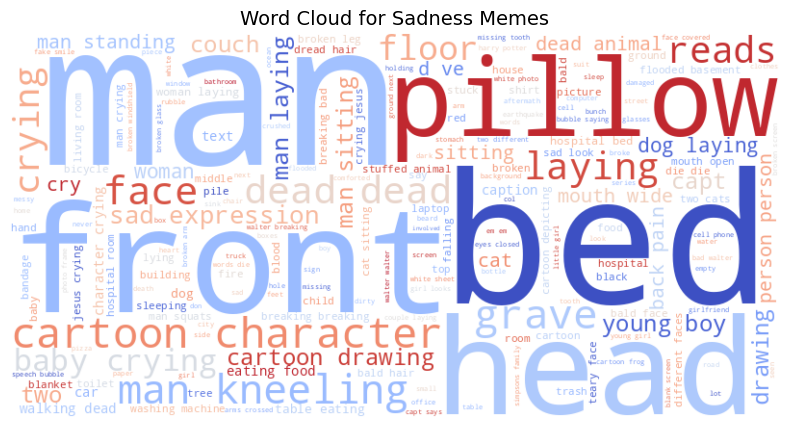

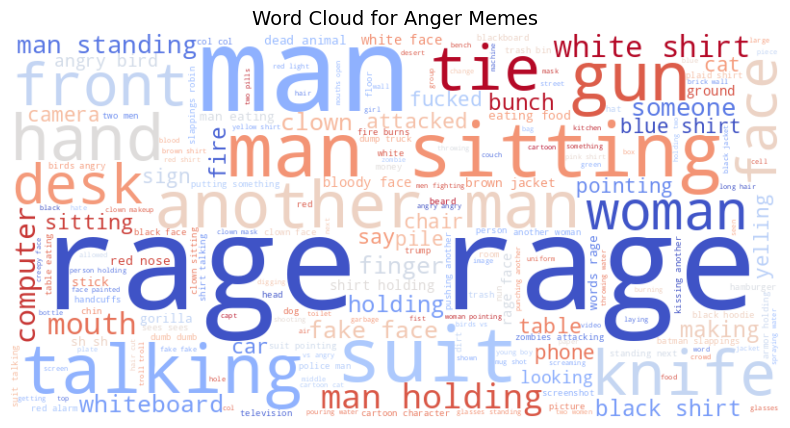

...

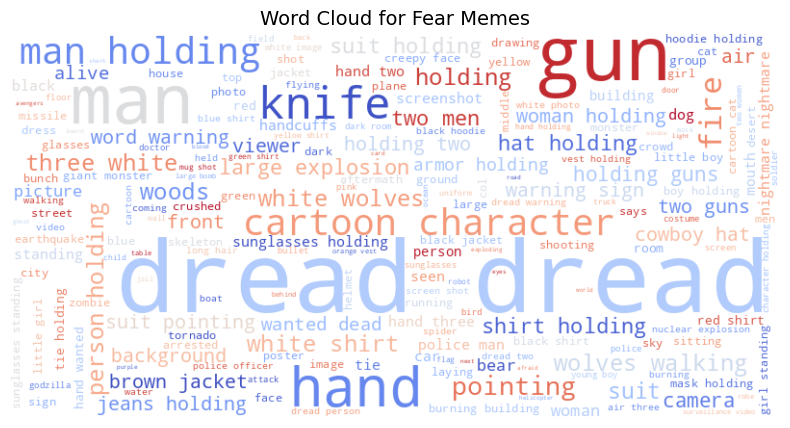

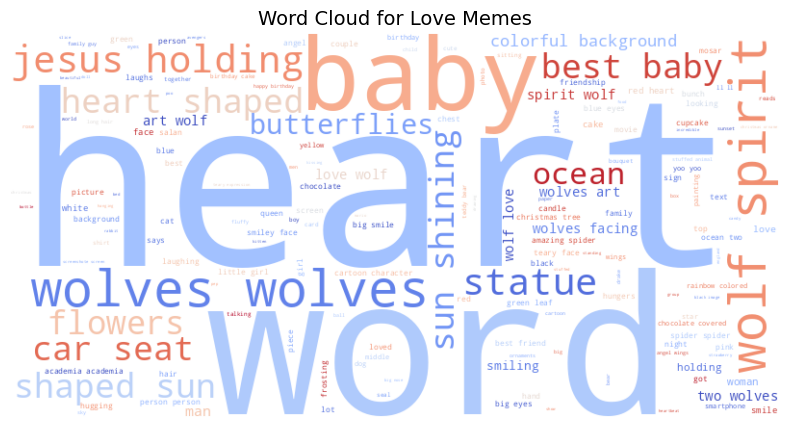

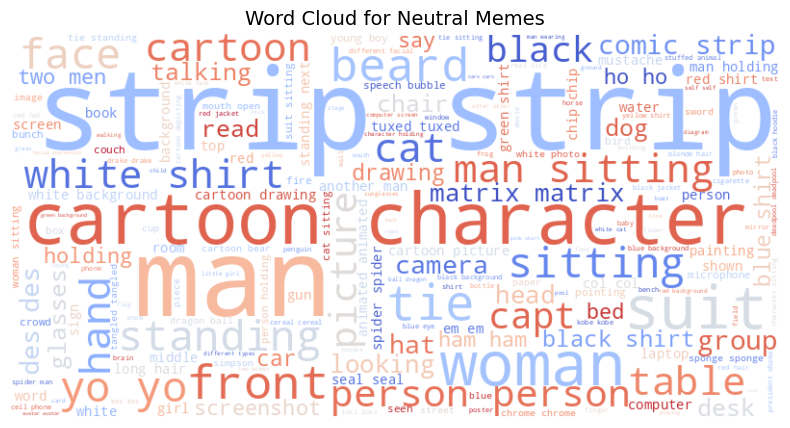

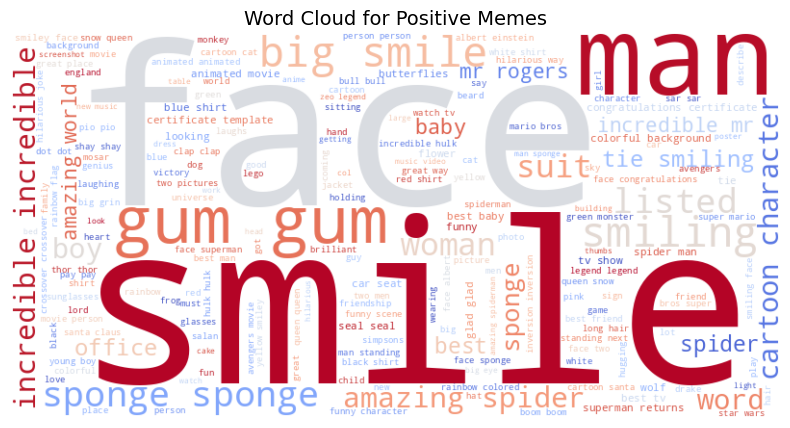

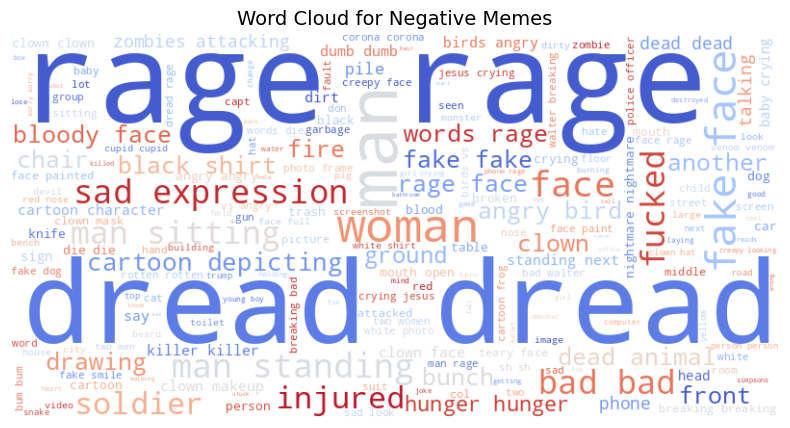

In [6]:
from wordcloud import WordCloud, STOPWORDS

threshold = 0.7  # Threshold for high-scoring memes
custom_stopwords = STOPWORDS.union({"T","meme","memes", "people","Reddit","make","made","S","one","know","day","time","now","u","will","see","Im","m","e"})

def plot_wordcloud(text, title, color="black"):
    wordcloud = WordCloud(stopwords=custom_stopwords,
    width=800, 
    height=400, 
    background_color=color, 
    colormap="coolwarm").generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title, fontsize=14)
    plt.show()

for sentiment in sentiment_cols:
    high_scoring_memes = df[df[sentiment] > threshold]["Caption"]
    if not high_scoring_memes.empty:
        plot_wordcloud(high_scoring_memes, f"Word Cloud for {sentiment.capitalize()} Memes", color="white")

## Sentiments vs Date Created

Joy and Neutral are highly domminant, we will put them in one group.
Anticipation & Disgust is the next group.
All other sentiments.

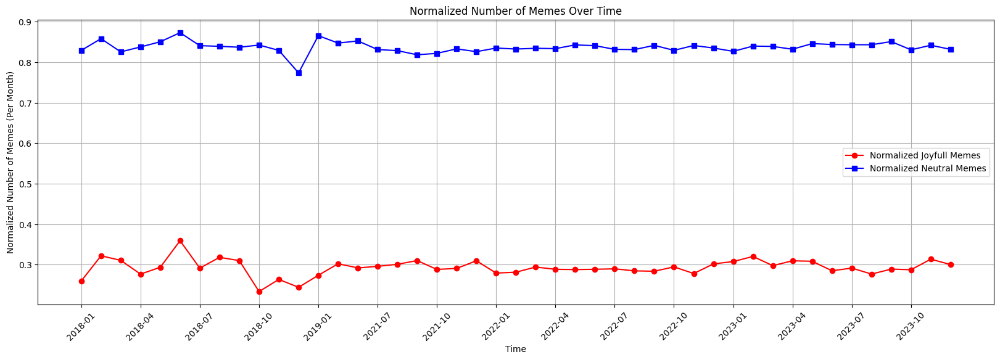

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

df_withDate = pd.read_csv("Reddit_GlobalContext.csv")

df_withDate['Date'] = pd.to_datetime(df_withDate['created_utc'])
df_withDate['Month'] = df_withDate['Date'].dt.to_period('M') 


threshold = 0.7

#total memes uploaded per month
meme_counts = df_withDate.groupby('Month').agg(
    total_memes=('Filename', 'size')
)

sentiment_counts = df_withDate.groupby('Month').agg(
    joyfull_memes=('joy_global', lambda x: (x > threshold).sum()),
    neutral_memes=('neutral_global', lambda x: (x > threshold).sum())
    )

normalized_sentiment_counts = sentiment_counts.div(meme_counts['total_memes'], axis=0)

plt.figure(figsize=(20, 6))
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["joyfull_memes"], marker='o', label="Normalized Joyfull Memes", color="red")
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["neutral_memes"], marker='s', label="Normalized Neutral Memes", color="blue")

plt.xlabel("Time")
plt.ylabel("Normalized Number of Memes (Per Month)")
plt.title("Normalized Number of Memes Over Time")

tick_positions = range(0, len(normalized_sentiment_counts), 3)
tick_labels = normalized_sentiment_counts.index.astype(str)[tick_positions]
plt.xticks(tick_positions, tick_labels, rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Sentiments vs Upvotes

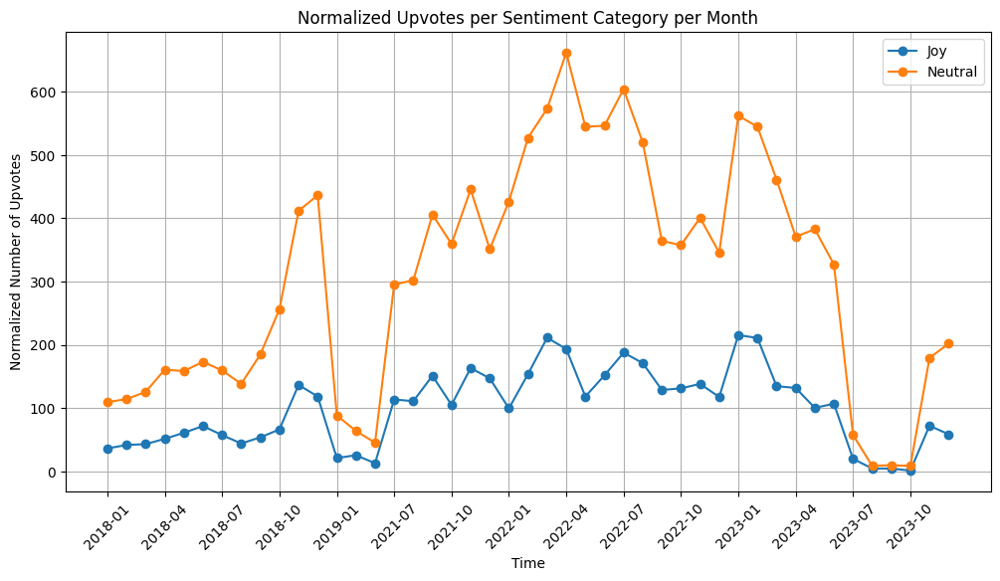

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("Reddit_GlobalContext.csv")
threshold = 0.7
df_filtered = df[
    (df["joy_global"] > threshold) |
    (df["neutral_global"] > threshold)
].copy()

df_filtered["Date"] = pd.to_datetime(df_filtered["created_utc"]) 
df_filtered["Month"] = df_filtered["Date"].dt.to_period("M")

monthly_engagement = df_filtered.groupby('Month').agg(
    joy_upvotes=('score', lambda x: x[df_filtered["joy_global"] > threshold].sum()/len(x)),
    neutral_upvotes=('score', lambda x: x[df_filtered["neutral_global"] > threshold].sum()/len(x))
).reset_index()

sentiment_categories = ["joy", "neutral"]

plt.figure(figsize=(12, 6))
for sentiment in sentiment_categories:
    plt.plot(monthly_engagement['Month'].astype(str), 
             monthly_engagement[f'{sentiment}_upvotes'], 
             marker='o', label=sentiment.capitalize())

plt.title("Normalized Upvotes per Sentiment Category per Month")
plt.xlabel("Time")
plt.ylabel("Normalized Number of Upvotes")
tick_positions = range(0, len(monthly_engagement), 3)
tick_labels = monthly_engagement['Month'].astype(str)[tick_positions]
plt.xticks(tick_positions, tick_labels, rotation=45)
plt.grid(True)
plt.legend()
plt.show()

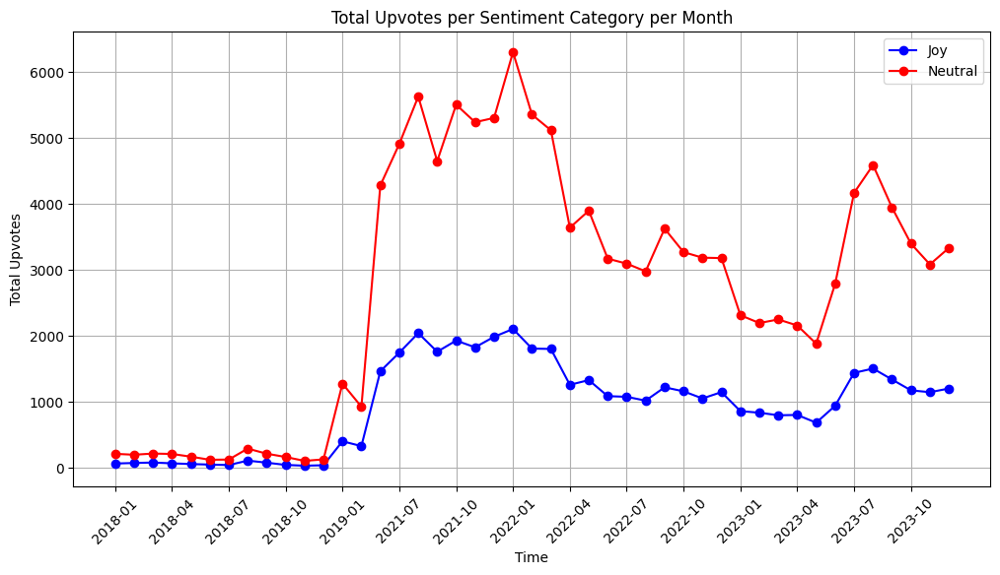

In [15]:
# total upvotes per sentiment category
monthly_engagement = df_filtered.groupby('Month').agg(
    total_joy_upvotes=('joy_global', lambda x: (x > 0.7).sum()),
    total_neutral_upvotes=('neutral_global', lambda x: (x > 0.7).sum())
).reset_index()

plt.figure(figsize=(12, 6))
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_joy_upvotes'], marker='o', color='blue', label='Joy')
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_neutral_upvotes'], marker='o', color='red', label='Neutral')

plt.title("Total Upvotes per Sentiment Category per Month")
plt.xlabel("Time")
plt.ylabel("Total Upvotes")
tick_positions = range(0, len(monthly_engagement), 3)
tick_labels = monthly_engagement['Month'].astype(str)[tick_positions]
plt.xticks(tick_positions, tick_labels, rotation=45)
plt.grid(True)
plt.legend()
plt.show()

## Topics Data Analysis

In [7]:
from bertopic import BERTopic
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import TfidfVectorizer
from sentence_transformers import SentenceTransformer
import pandas as pd
from bertopic.representation import KeyBERTInspired
from bertopic.representation import MaximalMarginalRelevance
import openai
from bertopic.representation import OpenAI
import csv
import os
import torch
import numpy as np

os.environ["TOKENIZERS_PARALLELISM"] = "false"

# Load dataset
df = pd.read_csv("Dataset/global_context.csv", header=None, names=["Filename", "Extracted Text"])
print(df.shape)
# get the first and second columns
# docs = df.iloc[:, 1].values
docs = df["Extracted Text"].astype(str).values
print(docs.shape)

# Define models
embedding_model = SentenceTransformer("all-mpnet-base-v2")
# embeddings = np.load("embeddings_mpnet_local.npy")
umap_model = UMAP(n_neighbors=20, n_components=5, min_dist=0.0, metric='cosine', random_state=42) #20,5,0.0
hdbscan_model = HDBSCAN(min_cluster_size=30, min_samples=10, metric='euclidean', cluster_selection_method='eom') #30
vectorizer_model = TfidfVectorizer(stop_words="english", max_features=10000)

# Generate embeddings
embeddings = embedding_model.encode(docs, show_progress_bar=True)  # returns np.ndarray
# np.save("embeddings_mpnet_global.npy", embeddings)
# print(embeddings.shape)

representation_model = [KeyBERTInspired(),MaximalMarginalRelevance(diversity=0.5)]
# Initialize BERTopic with custom components
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    nr_topics=200,
    representation_model=representation_model,
    # seed_topic_list=topics,
    verbose=True
)

# Fit the model
embeddings_mpnet_global = np.load("embeddings_mpnet_global.npy")
topics, probs = topic_model.fit_transform(docs, embeddings_mpnet_global)
doc_info = topic_model.get_document_info(docs)
doc_info = doc_info[['Document','Name', 'Probability']]

# Save the topics and probabilities as csv
doc_info.to_csv("topic_global_context.csv", index=False)

(300783, 2)
(300783,)


Batches:   0%|          | 0/9400 [00:00<?, ?it/s]

2026-01-15 02:31:15,977 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-15 02:52:01,023 - BERTopic - Dimensionality - Completed ✓
2026-01-15 02:52:01,025 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-15 02:52:08,473 - BERTopic - Cluster - Completed ✓
2026-01-15 02:52:08,474 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-15 02:52:10,217 - BERTopic - Representation - Completed ✓
2026-01-15 02:52:10,218 - BERTopic - Topic reduction - Reducing number of topics
2026-01-15 02:52:10,469 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-15 02:52:15,678 - BERTopic - Representation - Completed ✓
2026-01-15 02:52:15,693 - BERTopic - Topic reduction - Reduced number of topics from 2581 to 200


In [8]:
doc_info = topic_model.get_document_info(docs)
filtered_doc_info = doc_info[doc_info['Topic'] != -1]
filtered_doc_info

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
1,a cartoon bear with a man in a suit and tie,20,20_bear_cartoon_bears_sitting,"[bear, cartoon, bears, sitting, cub, teddy, wi...",[a cartoon bear and a bear bear are sitting to...,bear - cartoon - bears - sitting - cub - teddy...,0.855164,False
3,a man playing a bass in a room,50,50_microphone_microphones_headset_headphone,"[microphone, microphones, headset, headphone, ...",[a man with headphones on sitting in front of ...,microphone - microphones - headset - headphone...,1.000000,False
4,a group of men sitting at a long table,64,64_classroom_desks_students_teachers,"[classroom, desks, students, teachers, teachin...",[a group of people sitting at desks in a class...,classroom - desks - students - teachers - teac...,0.125253,False
5,a man in a suit and tie is pointing at the camera,2,2_suit_suits_ties_tie,"[suit, suits, ties, tie, wearing, person, podi...",[a man in a suit and tie standing next to anot...,suit - suits - ties - tie - wearing - person -...,1.000000,False
6,a screenshot of a man in a cave,0,0_comic_comics_cartoon_strip,"[comic, comics, cartoon, strip, manga, anime, ...",[a comic strip strip strip strip strip strip s...,comic - comics - cartoon - strip - manga - ani...,1.000000,False
...,...,...,...,...,...,...,...,...
300774,three yellow monsters with red eyes,88,88_yellow_blue_green_red,"[yellow, blue, green, red, colored, rainbow, b...",[a yellow em em em em em em em em em em em em ...,yellow - blue - green - red - colored - rainbo...,0.958289,False
300775,a man in a tie is standing in front of a wall ...,2,2_suit_suits_ties_tie,"[suit, suits, ties, tie, wearing, person, podi...",[a man in a suit and tie standing next to anot...,suit - suits - ties - tie - wearing - person -...,0.820728,False
300777,a duck in bed with a blanket,12,12_penguin_penguinling_penguins_bird,"[penguin, penguinling, penguins, bird, pigeon,...",[a penguin sitting on a chair with a bird on i...,penguin - penguinling - penguins - bird - pige...,0.781515,False
300778,a man in a costume is standing in the dirt,66,66_car_assembly_cars_engine,"[car, assembly, cars, engine, suv, toyota, for...","[a man is putting something on a car, a man is...",car - assembly - cars - engine - suv - toyota ...,0.006068,False


In [9]:
#Probability > 0.7
filtered_doc_info = doc_info[doc_info['Probability'] > 0.7]
print(len(filtered_doc_info))
filtered_doc_info.head()

186627


,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
1,a cartoon bear with a man in a suit and tie,20,20_bear_cartoon_bears_sitting,"[bear, cartoon, bears, sitting, cub, teddy, wi...",[a cartoon bear and a bear bear are sitting to...,bear - cartoon - bears - sitting - cub - teddy...,0.855164,False
3,a man playing a bass in a room,50,50_microphone_microphones_headset_headphone,"[microphone, microphones, headset, headphone, ...",[a man with headphones on sitting in front of ...,microphone - microphones - headset - headphone...,1.000000,False
5,a man in a suit and tie is pointing at the camera,2,2_suit_suits_ties_tie,"[suit, suits, ties, tie, wearing, person, podi...",[a man in a suit and tie standing next to anot...,suit - suits - ties - tie - wearing - person -...,1.000000,False
6,a screenshot of a man in a cave,0,0_comic_comics_cartoon_strip,"[comic, comics, cartoon, strip, manga, anime, ...",[a comic strip strip strip strip strip strip s...,comic - comics - cartoon - strip - manga - ani...,1.000000,False
7,a mouse is in the snow with a mouse,0,0_comic_comics_cartoon_strip,"[comic, comics, cartoon, strip, manga, anime, ...",[a comic strip strip strip strip strip strip s...,comic - comics - cartoon - strip - manga - ani...,1.000000,False


In [10]:
topic_model.visualize_topics()

Name
0_comic_comics_cartoon_strip              23137
1_dread_hair_haircut_beardcut             14670
2_suit_suits_ties_tie                     12366
3_cat_kitten_cats_cartoon                  7168
4_desk_laptop_computer_monitor             5695
5_handgun_gun_weapon_rifle                 4626
8_painting_art_drawing_suit                3374
7_chrome_browser_logo_logos                3346
9_rick_meme_jack_deadpool                  3160
10_dresses_dress_woman_couple              2618
12_penguin_penguinling_penguins_bird       2609
13_blonde_woman_hair_mohawk                2608
15_husky_dog_collar_pup                    2568
11_phone_talking_phones_smartphone         2415
17_simpsons_simpsonss_cartoons_simpson     2296
16_pointing_gesturing_gesture_finger       2091
18_box_boxes_cartoon_cardboard             1991
14_sign_signs_table_change                 1907
21_driving_car_woman_driver                1903
20_bear_cartoon_bears_sitting              1835
Name: count, dtype: int64


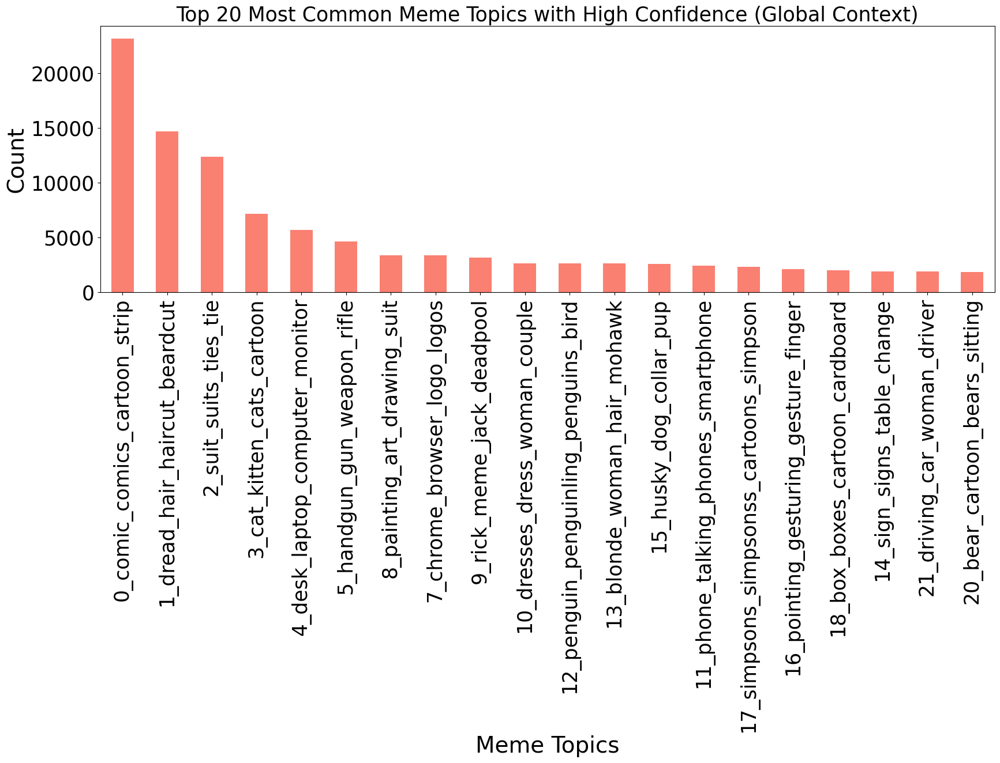

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("Dataset/topic_global_context.csv")

high_confidence_memes = df[df["Probability"] > 0.7]

high_confidence_counts = high_confidence_memes["Name"].value_counts()

print(high_confidence_counts.head(20))

plt.figure(figsize=(20, 6))
ax = high_confidence_counts[:20].plot(kind='bar', color='salmon')  # Show top 20 topics
ax.tick_params(axis='both', labelsize=25)  # numbers on axes
plt.xlabel("Meme Topics", fontsize=28)
plt.ylabel("Count", fontsize=28)
plt.title("Top 20 Most Common Meme Topics with High Confidence (Global Context)", fontsize = 25)
plt.xticks(rotation=90)
plt.show()